# Metabolic zonation on the Slide-TCR-seq human lung RCC dataset

In this tutorial, we go through the steps of performing metabolic zonation with Harreman, an algorithm for identifying metabolic crosstalk from spatially resolved transcriptomics of intact tissues. Harreman reconstructs molecular metabolic crosstalk based on co-localized expression of metabolite transporters. By utilizing a series of increasingly detailed models for testing spatial correlation, Harreman provides insight at multiple levels: a) coarse partition of the tissue into regions sharing metabolic characteristics; b) identification of metabolic exchanges within each region; and c) inference of the cell subsets involved in those exchanges.

Plan for this tutorial:

1. Loading the data.
2. Filtering out lowly expressed genes.
3. Computing metabolic enzyme autocorrelation to identify spatially relevant genes.
4. Computing local correlations between spatial genes to identify modules.
5. Computing module scores and visualizing them across the slides.
6. Assigning top-scoring modules to every spot. 

## Loading the dataset

In this tutorial, we will work with a dataset of lung metastasis originating from renal cell carcinoma (RCC) published by Liu et al., *Immunity*, 2022, and consisting of seven tissue sections of the same patient, profiled with Slide-seq (Rodriques et al., *Science*, 2019; 200,394 spots of 10 micrometers in diameter in total).

In [1]:
import harreman
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Patch
import warnings
warnings.filterwarnings("ignore")

The original AnnData files corresponding to the 7 samples mentiond below were downloaded from https://cellxgene.cziscience.com/collections/02b01703-bf1b-48de-b99a-23bef8cccc81.

We load the dataset using the function below. The data corresponding to one individual sample can also be loaded by specifying the sample name to the `sample` argument. For example, if we only wanted to load the data corresponding to sample *Puck_200727_08*, we would use the command below:

`adata = harreman.datasets.load_slide_seq_human_lung_dataset(sample='Puck_200727_08')`

The dataset consists of the following 7 samples:
*Puck_200727_08*, *Puck_200727_09*, *Puck_200727_10*, *Puck_220408_13*, *Puck_220408_14*, *Puck_220408_15*, and *Puck_220408_20*.

However, in this tutorial we will make use of all the samples.

In [2]:
adata = harreman.datasets.load_slide_seq_human_lung_dataset()

100%|██████████| 1.54G/1.54G [00:36<00:00, 45.3MB/s]


In [3]:
adata

AnnData object with n_obs × n_vars = 200394 × 21387
    obs: 'n_genes', 'n_UMIs', 'log10_n_UMIs', 'log10_n_genes', 'organism_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'Cell_Type', 'cell_type_ontology_term_id', 'donor_id', 'is_primary_data', 'suspension_type', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'sample'
    obsm: 'spatial'
    layers: 'counts', 'log_norm', 'normalized'

We then filter out genes expressed in less than 50 spots per sample.

In [4]:
sample_col = 'sample'
n_genes_expr = 50
genes_to_keep = np.zeros(adata.shape[1], dtype=bool)

for sample in adata.obs[sample_col].unique():
    adata_sample = adata[adata.obs[sample_col] == sample]
    expressed = np.array((adata_sample.X > 0).sum(axis=0)).flatten()
    genes_to_keep |= expressed >= n_genes_expr

adata = adata[:, genes_to_keep].copy()

In [5]:
adata

AnnData object with n_obs × n_vars = 200394 × 14148
    obs: 'n_genes', 'n_UMIs', 'log10_n_UMIs', 'log10_n_genes', 'organism_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'Cell_Type', 'cell_type_ontology_term_id', 'donor_id', 'is_primary_data', 'suspension_type', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'sample'
    obsm: 'spatial'
    layers: 'counts', 'log_norm', 'normalized'

## Functions

We also load the function that will be used to visualize the individual tissue slides.

In [6]:
def plot_tissue_slide(adata, colors):
    
    ax = plt.subplot(111)
    ax.set_aspect('equal', adjustable='box')

    distance = 200

    ax.yaxis.set_ticks_position("left")
    ax.xaxis.set_ticks_position("bottom")
    plt.xticks([])
    plt.yticks([])
    plt.xlabel("Spatial1")
    plt.ylabel("Spatial2")

    x_start, y_start = min(adata.obsm['spatial'][:, 0]), min(adata.obsm['spatial'][:, 1])
    x_end, y_end = x_start + distance, y_start

    plt.scatter(
        adata.obsm['spatial'][:, 0],
        adata.obsm['spatial'][:, 1],
        alpha=1,
        s=.1,
        c=colors,
    )

    ax.plot([x_start, x_end], [y_start, y_end], color='black')

## Metabolic zonation

Firstly, we compute the neighborhood graph using the `compute_knn_graph` function. For this, we need to specify the latent (or observed) space we are using to compute our cell metric with the `compute_neighbors_on_key` parameter. Further, only one of `compute_neighbors_on_key` or `distances_obsp_key` is needed in order to run the function. Similarly, either the `neighborhood_radius` or the `n_neighbors` parameter needs to be used (the former needs to contain information in micrometers). The `sample_key` parameter is optional and is only required when more than one sample are present in the AnnData and we want to avoid having neighbors across different samples.

Here, we set `weighted_graph=False` to just use binary, 0-1 weights and `neighborhood_radius=100` to create a local neighborhood with a radius of 100 micrometers. Larger neighborhood sizes can result in more robust detection of correlations and autocorrelations at a cost of missing more fine-grained, smaller-scale, spatial patterns. Further, set `sample_key='sample'` to make sure there are no shared neighbors between samples.

In [7]:
harreman.tl.compute_knn_graph(adata, 
                           compute_neighbors_on_key="spatial", 
                           neighborhood_radius=100,
                           weighted_graph=False,
                           sample_key='sample',
                           verbose=True)

Computing the neighborhood graph...
Restricting graph within samples using 'sample'...


  0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


Computing the weights...
Finished computing the KNN graph in 9.097 seconds


Once the neighborhood graph is computed, local autocorrelation needs to be assessed using the `compute_local_autocorrelation` function. For this, we need to specify the gene counts matrix (with the `layer_key` parameter), which background model to use (with the `model` parameter), the species the dataset corresponds to (with the `species` parameter), the per-cell scaling factor (optional, with the `umi_counts_obs_key` parameter), and whether we want to focus on metabolic genes or not (with the `use_metabolic_genes` parameter).

Here, we are focusing on the metabolic enzymes from human and we are using the Bernoulli distribution to model our count data.

In [11]:
harreman.hs.compute_local_autocorrelation(adata, layer_key="counts", model='bernoulli', species='human', use_metabolic_genes=True, verbose=True)

Computing local autocorrelation...


Local autocorrelation results are stored in adata.uns['gene_autocorrelation_results']
Finished computing local autocorrelation in 4.466 seconds


We only use those genes with a significant autocorrelation (FDR < 0.01) for the subsequent analysis.

In [12]:
gene_autocorrelation_results = adata.uns['gene_autocorrelation_results']
genes = gene_autocorrelation_results.loc[gene_autocorrelation_results.Z_FDR < 0.01].sort_values('Z', ascending=False).index

To get a better idea of what spatial patterns exist, it is helpful to group the genes into modules. This is done by using the concept of *local correlations* - that is, correlations that are computed between genes between cells in the same neighborhood.

Here, we avoid running the calculation for all Genes x Genes pairs and instead only run this on genes that have significant spatial autocorrelation to begin with.

The `compute_local_correlation` function returns a Genes x Genes matrix of Z-scores for the significance of the correlation between genes. This object is retained in the AnnData object and is used in the subsequent steps.

In [13]:
harreman.hs.compute_local_correlation(adata, genes=genes, verbose=True)

Computing pair-wise local correlation on 605 features...
Pair-wise local correlation results are stored in adata.uns with the following keys: ['lcs', 'lc_zs', 'lc_z_pvals', 'lc_z_FDR']
Finished computing pair-wise local correlation in 3.863 seconds


Now that pairwise local correlations are calculated, we can group genes into modules.

To do this, the `create_modules` function is used, which performs agglomerative clustering with two caveats:

1. If the FDR-adjusted p-value of the correlation between two branches exceeds `fdr_threshold`, then the branches are not merged.

2. If two branches are to be merged and they both have at least `min_gene_threshold` genes, then the branches are not merged. Further genes that would join to the resulting merged module (and are therefore ambiguous) either remain unassigned (if `core_only=True`) or are assigned to the module with the smaller average correlations between genes, i.e. the least-dense module (if `core_only=False`). Unassigned genes are indicated with a module number of -1.

In [14]:
harreman.hs.create_modules(adata, min_gene_threshold=20)

We then can visualize the created modules.

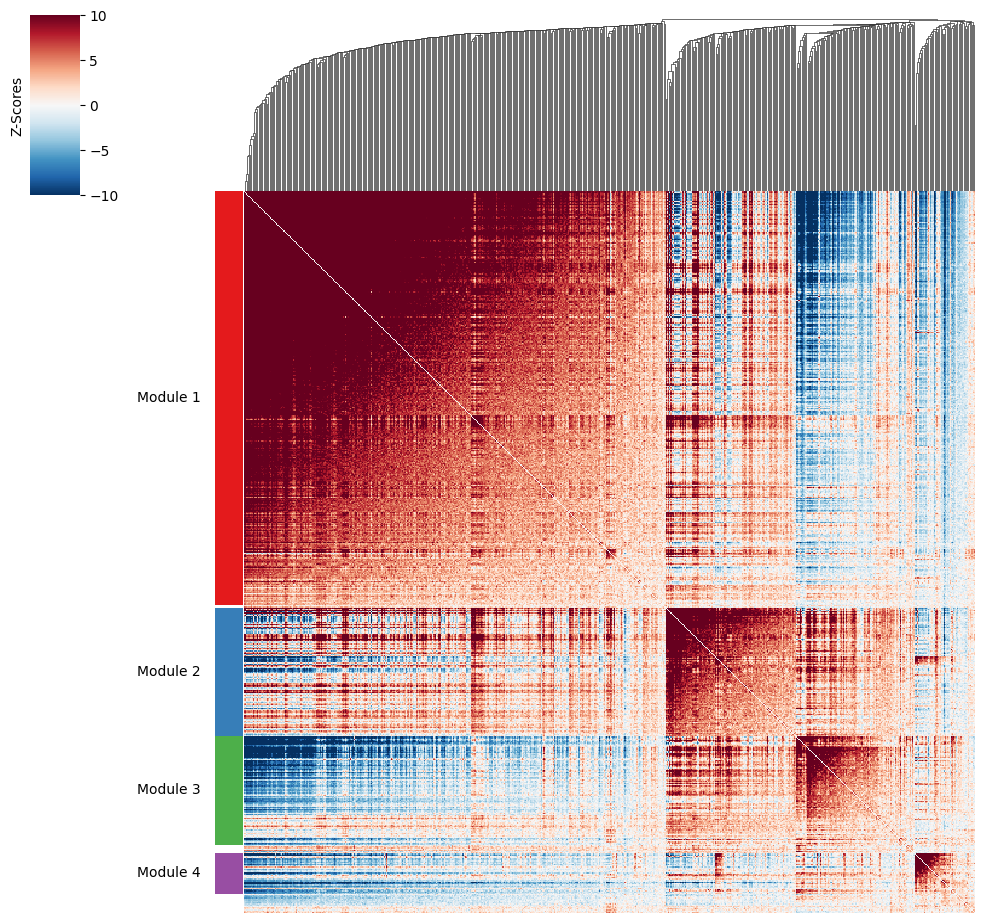

In [15]:
harreman.pl.local_correlation_plot(adata, mod_cmap='Set1')

To characterize the general behavior of a module, module scores are computed.

In [16]:
harreman.hs.calculate_module_scores(adata)

100%|██████████| 4/4 [00:12<00:00,  3.05s/it]


In [17]:
modules = adata.obsm['module_scores'].columns
adata.obs[modules] = adata.obsm['module_scores']

Puck_220408_20


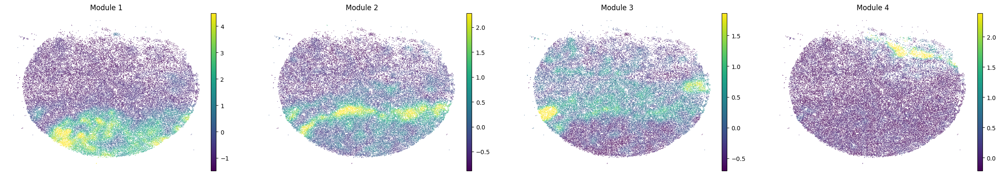

Puck_220408_13


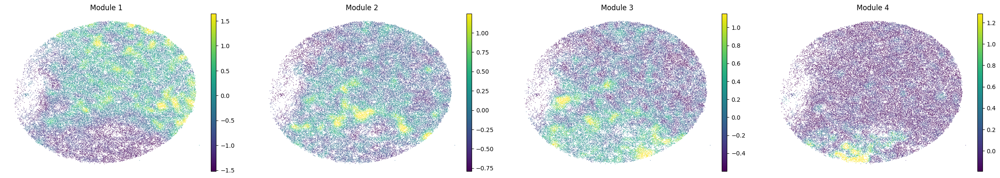

Puck_220408_15


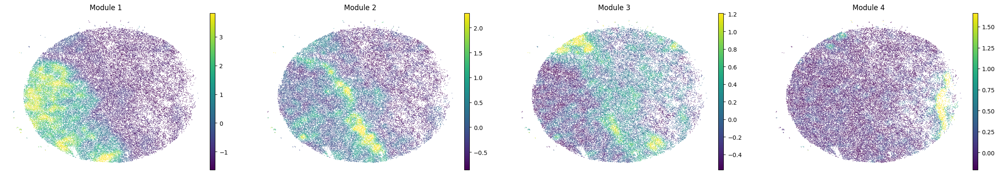

Puck_200727_09


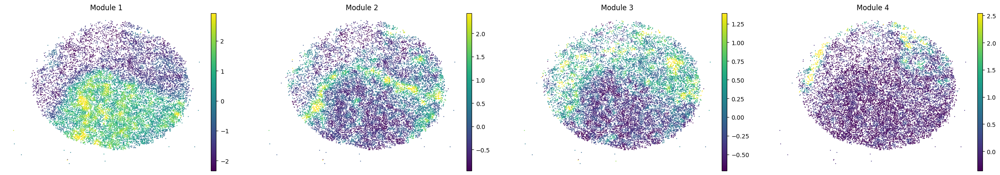

Puck_200727_10


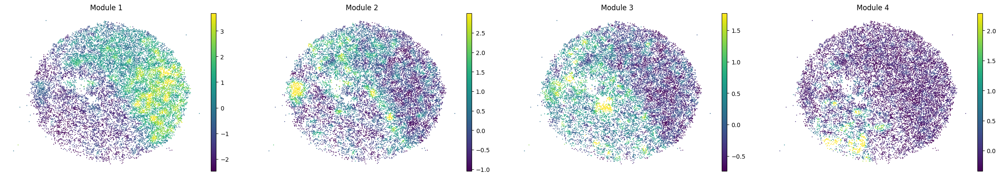

Puck_200727_08


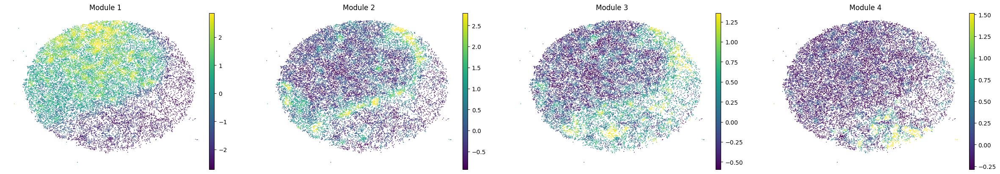

Puck_220408_14


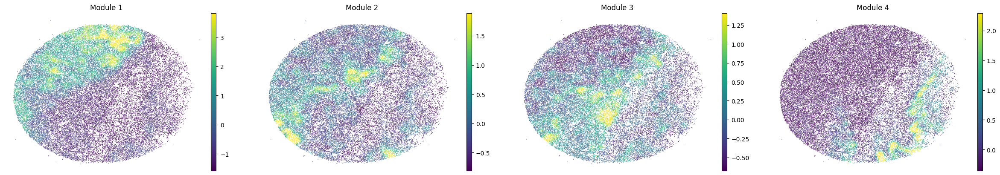

In [18]:
for sample in adata.obs['sample'].unique():
    print(sample)
    sample_adata = adata[adata.obs['sample'] == sample].copy()
    sc.pl.embedding(sample_adata, basis='spatial', color=modules, frameon=False, vmin="p1", vmax="p99", ncols=5)

To assign spots as top-scoring for a module, the `compute_top_scoring_modules` function is used. Here, we Z-normalize all module scores across spots, and then require a top-scoring spot to very specifically express a given module and not express any others. To ensure this, we require top-scoring spots to have (1) a score of >1 standard deviation (specified by the `sd` parameter; `sd=1` by default) above its mean module score, and (2) a score of <1 standard deviation above the mean for all other modules. If the first condition is not met, that is, if none of the modules has a value higher than 1 standard deviation above the mean for a given spot, then the module with the highest Z-normalized value is assigned to the spot. In case the second condition is not met, that is, if there is more than one module with a value higher than 1 standard deviation above the mean for a given spot, then the module with the highest Z-normalized value among those modules that meet condition (1) is selected. Finally, if none of the modules have a higher value than the mean for a given spot, then this spot ends up unassigned.

The `use_super_modules` parameters specifies whether top-scoring modules should be computed at the module (`False`) or super-module (`True`) level.

In [19]:
adata.obs['top_module'] = harreman.hs.compute_top_scoring_modules(adata, sd=1, use_super_modules=False)

In [20]:
colors = ["#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#FFFF33", "#A65628", "#F781BF", "#999999"]
palette_m = {mod: colors[int(mod.split(' ')[1])-1] for mod in adata.obs['top_module'].dropna().unique()}

Puck_220408_20


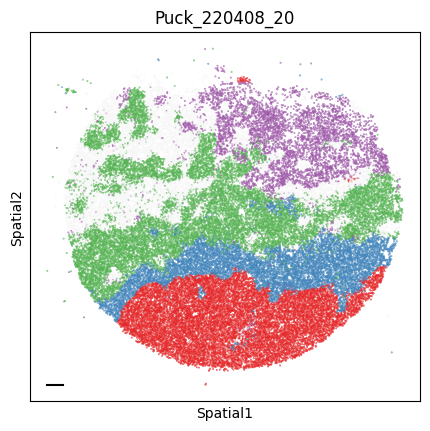

Puck_220408_13


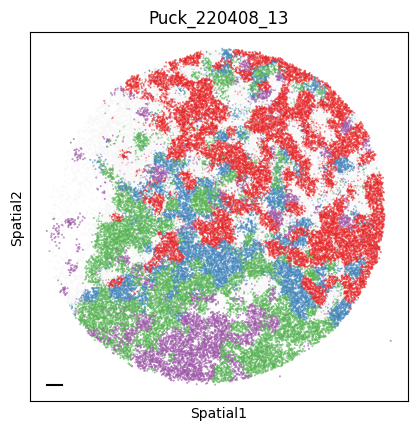

Puck_220408_15


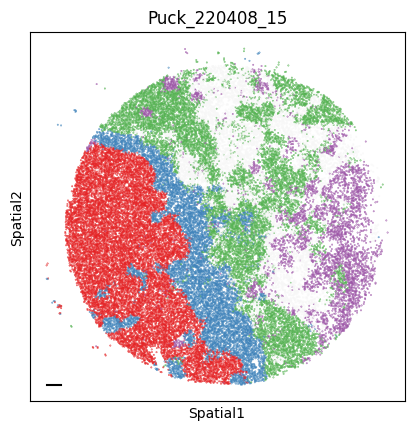

Puck_200727_09


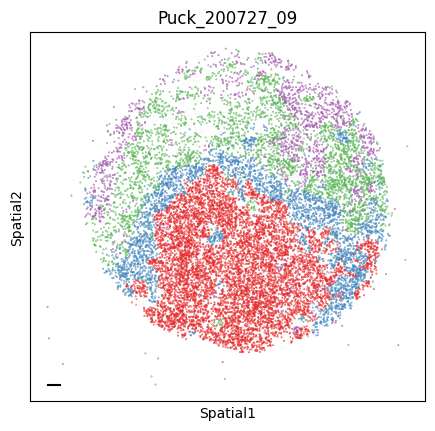

Puck_200727_10


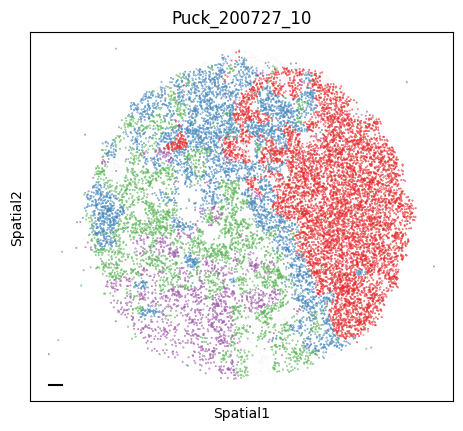

Puck_200727_08


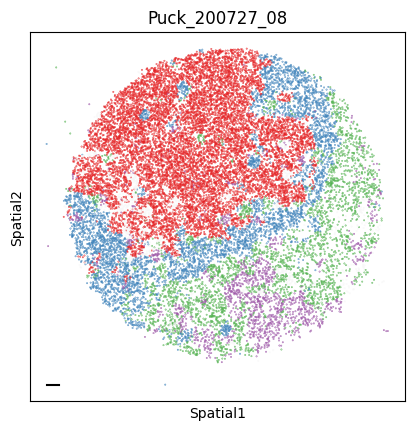

Puck_220408_14


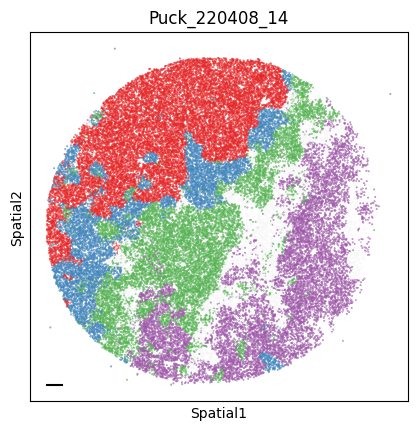

In [21]:
na_color = '#F7F7F7'
for sample in adata.obs['sample'].unique():
    print(sample)
    sample_adata = adata[adata.obs['sample'] == sample].copy()
    colors = sample_adata.obs.top_module.astype(str).apply(lambda x: palette_m[x] if x in palette_m.keys() else na_color)
    plot_tissue_slide(sample_adata, colors)
    plt.title(sample)
    plt.show()
    plt.close()

Finally, we save the AnnData to use it in the [following tutorial](https://harreman.readthedocs.io/en/latest/tutorials/notebooks/Slide_seq_lung_metabolic_crosstalk.html).

In [ ]:
harreman.write_h5ad(adata, 'Slide_seq_lung_metabolic_zonation.h5ad')